# Installing liberaries

In [ ]:
!pip install kagglehub pandas numpy matplotlib seaborn plotly wordcloud scikit-learn nltk

# Importing Dataset

In [3]:

import kagglehub

# Download the latest version of the dataset
path = kagglehub.dataset_download("snehaanbhawal/resume-dataset")

print("✅ Dataset downloaded to:", path)


100%|█████████████████████████████████████████████████████████████████████████████| 62.5M/62.5M [01:01<00:00, 1.06MB/s]

Extracting files...


✅ Dataset downloaded to: C:\Users\sansk\.cache\kagglehub\datasets\snehaanbhawal\resume-dataset\versions\1


# Download and Access Dataset from Kaggle

In [11]:
import os
import kagglehub

# Reconfirm the dataset path
path = kagglehub.dataset_download("snehaanbhawal/resume-dataset")

print("✅ Dataset folder:", path)
print("\nFiles and folders inside it:")
print(os.listdir(path))


✅ Dataset folder: C:\Users\sansk\.cache\kagglehub\datasets\snehaanbhawal\resume-dataset\versions\1

Files and folders inside it:
['data', 'Resume']


# Explore Dataset Directory Structure

In [13]:
print(os.listdir(os.path.join(path, "data")))


['data']


# Load Resume Dataset (CSV File)

In [15]:
import pandas as pd

# Search for Resume.csv inside the dataset directory
csv_path = None
for root, dirs, files in os.walk(path):
    for file in files:
        if file.lower().endswith("resume.csv"):
            csv_path = os.path.join(root, file)
            break

if csv_path:
    print("✅ Found CSV at:", csv_path)
    df = pd.read_csv(csv_path)
    print("Shape:", df.shape)
    display(df.head())
else:
    print("❌ Resume.csv not found — please check the folder manually.")


✅ Found CSV at: C:\Users\sansk\.cache\kagglehub\datasets\snehaanbhawal\resume-dataset\versions\1\Resume\Resume.csv
Shape: (2484, 4)


,ID,Resume_str,Resume_html,Category
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR


# Data Cleaning and Preprocessing

In [17]:
# Drop duplicates
df.drop_duplicates(subset="Resume_str", inplace=True)

# Drop rows with missing values
df.dropna(subset=["Resume_str", "Category"], inplace=True)

# Clean text (remove HTML tags, punctuation, stopwords)
import re
import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")

stop_words = set(stopwords.words("english"))

def clean_text(text):
    text = re.sub(r'<.*?>', '', text)  # remove HTML
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # remove punctuation/numbers
    text = text.lower()
    text = " ".join([word for word in text.split() if word not in stop_words])
    return text

df["clean_resume"] = df["Resume_str"].apply(clean_text)
df.head(2)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sansk\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


,ID,Resume_str,Resume_html,Category,clean_resume
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR,hr administratormarketing associate hr adminis...
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR,hr specialist us hr operations summary versati...


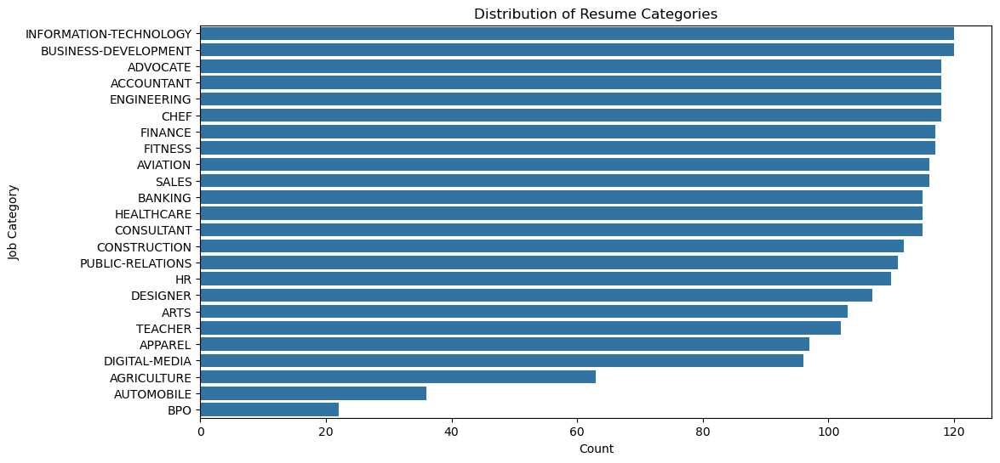

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Category distribution
plt.figure(figsize=(12,6))
sns.countplot(y="Category", data=df, order=df["Category"].value_counts().index)
plt.title("Distribution of Resume Categories")
plt.xlabel("Count")
plt.ylabel("Job Category")
plt.show()


# Explore Resume Categories

In [74]:
df["Category"].unique()


array(['HR', 'DESIGNER', 'INFORMATION-TECHNOLOGY', 'TEACHER', 'ADVOCATE',
       'BUSINESS-DEVELOPMENT', 'HEALTHCARE', 'FITNESS', 'AGRICULTURE',
       'BPO', 'SALES', 'CONSULTANT', 'DIGITAL-MEDIA', 'AUTOMOBILE',
       'CHEF', 'FINANCE', 'APPAREL', 'ENGINEERING', 'ACCOUNTANT',
       'CONSTRUCTION', 'PUBLIC-RELATIONS', 'BANKING', 'ARTS', 'AVIATION'],
      dtype=object)

# WordCloud Visualization for Each Category

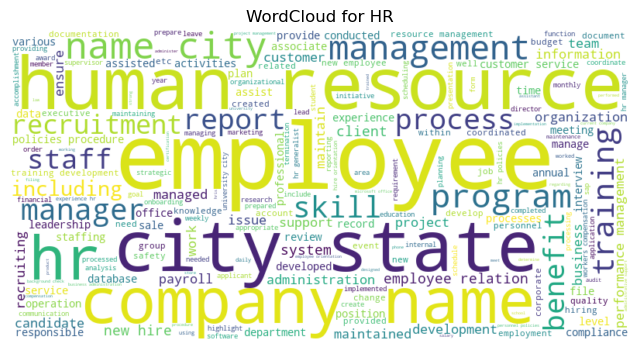

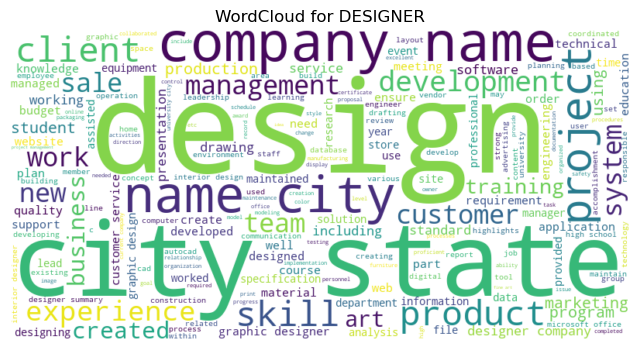

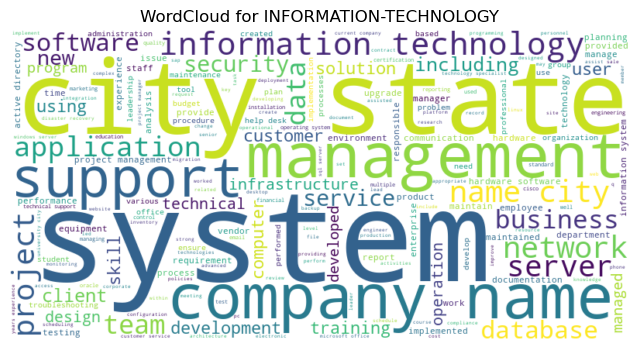

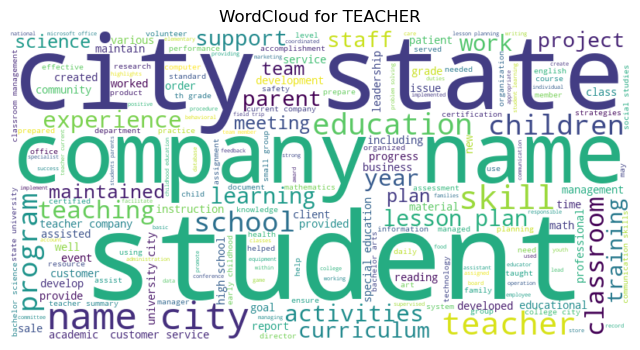

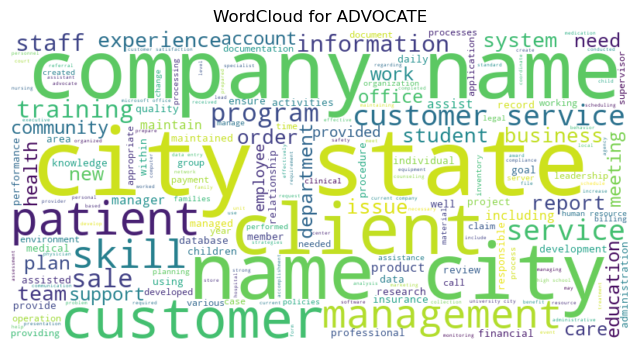

...

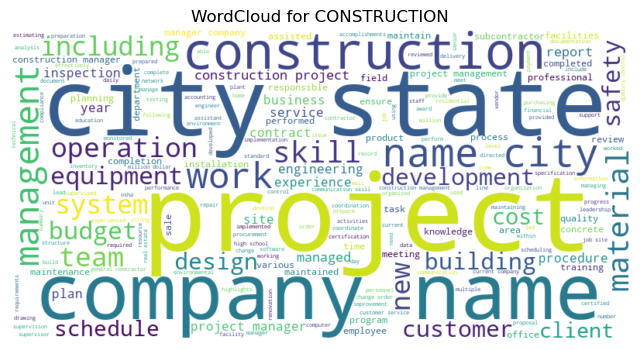

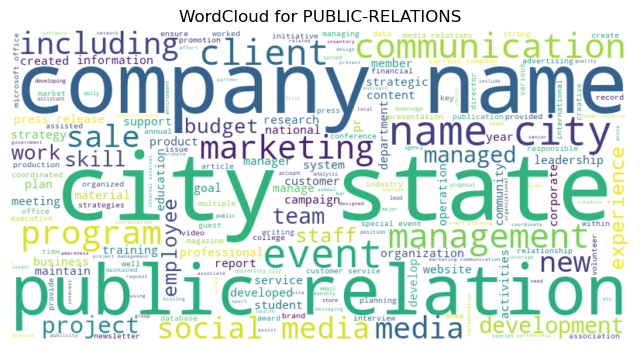

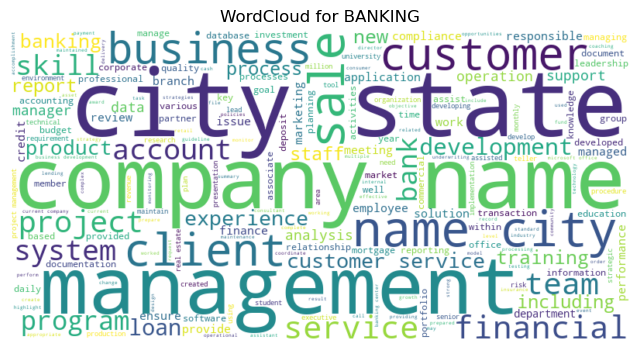

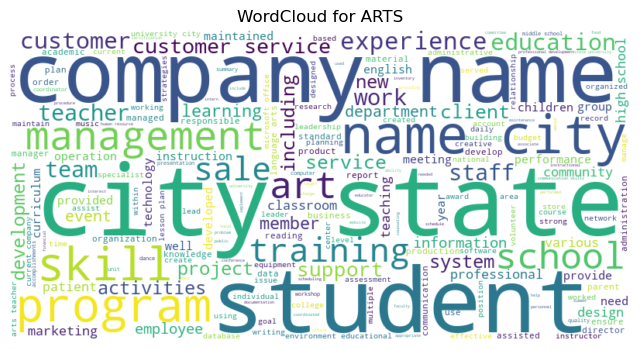

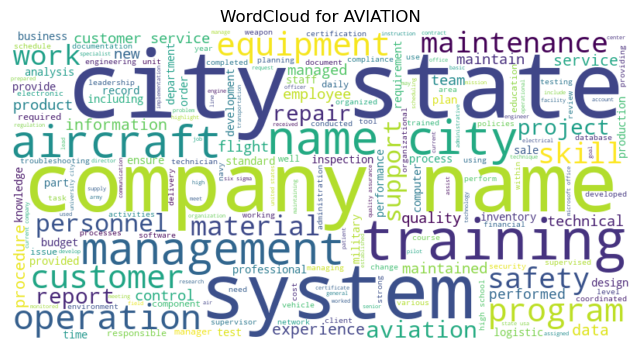

In [33]:
for cat in df["Category"].unique():
    text = " ".join(df[df["Category"] == cat]["clean_resume"])
    if len(text.strip()) == 0:
        continue
    plt.figure(figsize=(8,5))
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"WordCloud for {cat}")
    plt.show()


# Enhanced Text Cleaning with Lemmatization

In [37]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text_v2(text):
    text = re.sub(r'<.*?>', '', text)  # remove HTML
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # keep letters only
    text = text.lower()
    tokens = text.split()
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return " ".join(tokens)

df["clean_resume"] = df["Resume_str"].apply(clean_text_v2)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sansk\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sansk\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\sansk\AppData\Roaming\nltk_data...


# Model Training using Support Vector Machine (SVM)

In [45]:
from sklearn.svm import LinearSVC

svm_model = LinearSVC()
svm_model.fit(X_train_tfidf, y_train)

y_pred_svm = svm_model.predict(X_test_tfidf)
print("🔥 SVM Accuracy:", accuracy_score(y_test, y_pred_svm))
print("\nClassification Report:\n", classification_report(y_test, y_pred_svm))


🔥 SVM Accuracy: 0.7263581488933601

Classification Report:
                         precision    recall  f1-score   support

            ACCOUNTANT       0.62      0.88      0.72        24
              ADVOCATE       0.68      0.71      0.69        24
           AGRICULTURE       1.00      0.54      0.70        13
               APPAREL       0.62      0.42      0.50        19
                  ARTS       0.50      0.43      0.46        21
            AUTOMOBILE       1.00      0.43      0.60         7
              AVIATION       0.89      0.74      0.81        23
               BANKING       0.86      0.78      0.82        23
                   BPO       0.00      0.00      0.00         4
  BUSINESS-DEVELOPMENT       0.68      0.88      0.76        24
                  CHEF       0.86      0.75      0.80        24
          CONSTRUCTION       0.78      0.82      0.80        22
            CONSULTANT       0.79      0.48      0.59        23
              DESIGNER       0.86      0.86

# Predict Category for a New Resume

In [49]:
# Example: new resume text input
sample_resume = """
Experienced data analyst with 3 years of experience in Python, SQL, Power BI, 
and machine learning. Strong understanding of data cleaning, predictive modeling,
and statistical analysis. Seeking a data scientist position.
"""

# Clean and vectorize the sample text
clean_sample = clean_text_v2(sample_resume)
sample_vec = tfidf.transform([clean_sample])

# Predict category
predicted_category = svm_model.predict(sample_vec)[0]
print("🧠 Predicted Category:", predicted_category)


🧠 Predicted Category: BUSINESS-DEVELOPMENT


# Visualizations

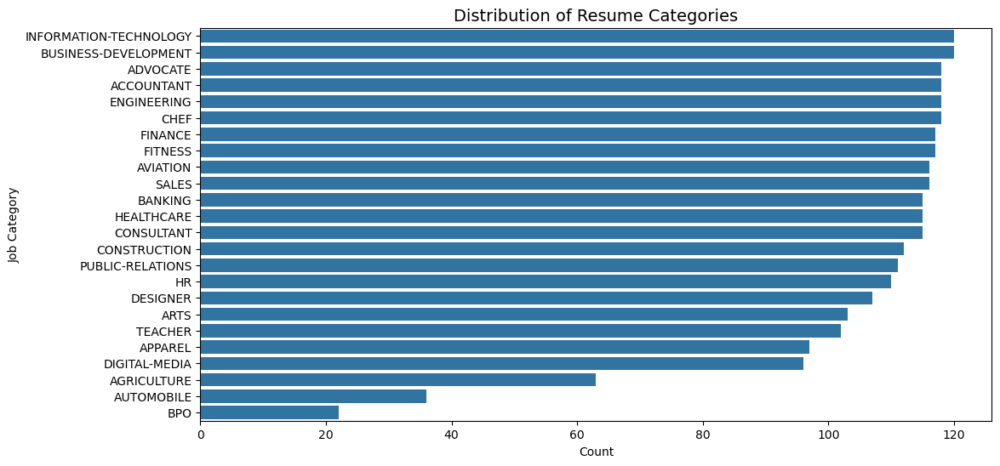

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
sns.countplot(y="Category", data=df, order=df["Category"].value_counts().index)
plt.title("Distribution of Resume Categories", fontsize=14)
plt.xlabel("Count")
plt.ylabel("Job Category")
plt.show()


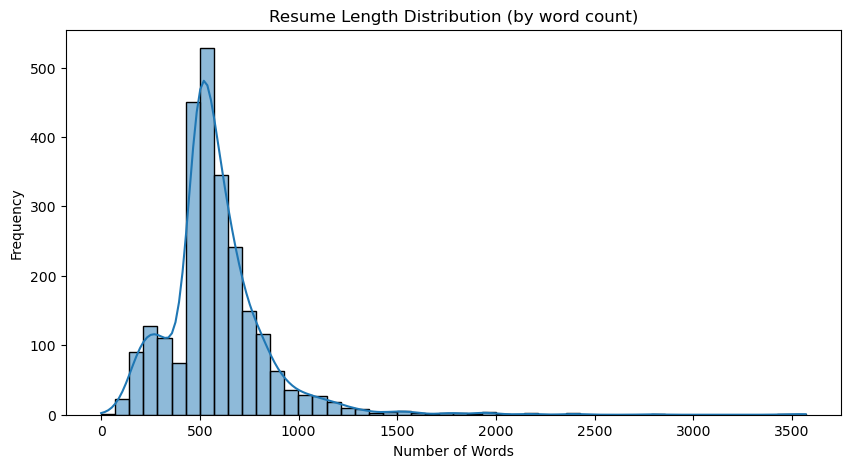

In [55]:
df["resume_length"] = df["clean_resume"].apply(lambda x: len(x.split()))

plt.figure(figsize=(10,5))
sns.histplot(df["resume_length"], bins=50, kde=True)
plt.title("Resume Length Distribution (by word count)")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()


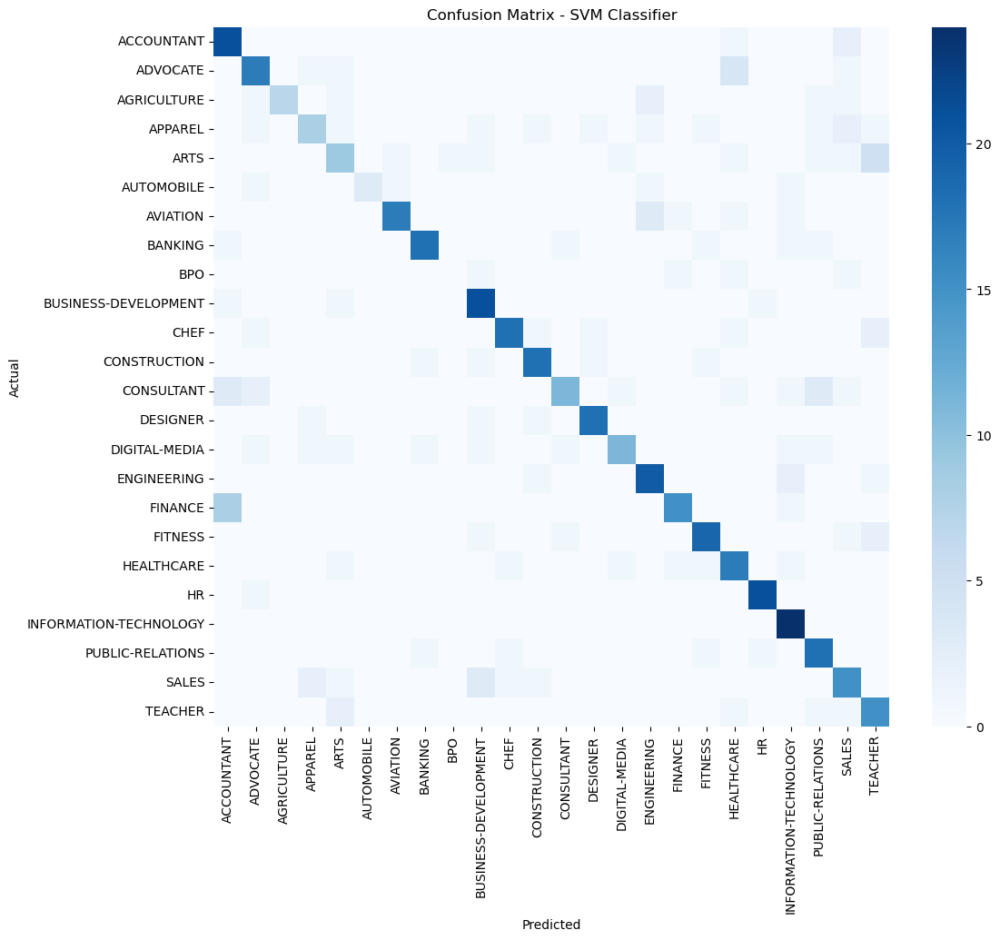

In [57]:
from sklearn.metrics import confusion_matrix
import numpy as np

y_pred_svm = svm_model.predict(X_test_tfidf)
cm = confusion_matrix(y_test, y_pred_svm, labels=svm_model.classes_)

plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=False, cmap="Blues", xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
plt.title("Confusion Matrix - SVM Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


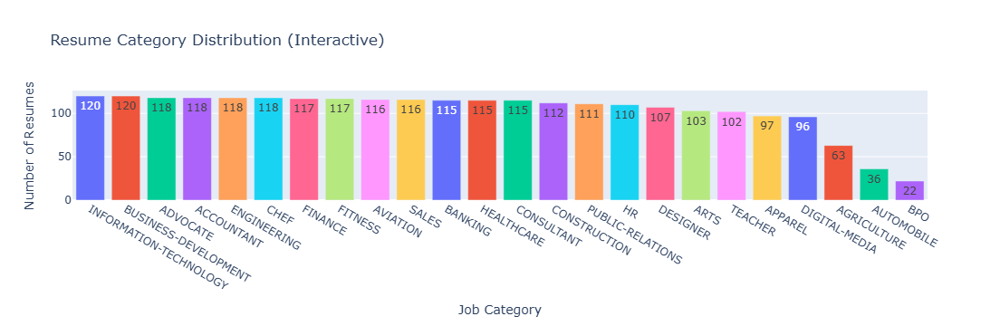

In [61]:
import plotly.express as px

# Create a dataframe of category counts
cat_counts = df["Category"].value_counts().reset_index()
cat_counts.columns = ["Category", "Count"]  # rename columns clearly

# Create an interactive bar chart
fig = px.bar(
    cat_counts,
    x="Category",
    y="Count",
    title="Resume Category Distribution (Interactive)",
    color="Category",
    text="Count"
)

fig.update_layout(
    xaxis_title="Job Category",
    yaxis_title="Number of Resumes",
    showlegend=False
)

fig.show()
